# chx10 recruitment analysis during MLR electrical stimulation

----------  



    

In [12]:
import numpy as np
import pandas as pd
import os
import sys
import pickle
import logging
from matplotlib import cm
import matplotlib.pyplot as plt

sys.path.insert(1, '../utils/')
from import_data import load_suite2p_outputs
from calcium_traces import *
from ref_pos import get_ref_pos, addRefPos

In [13]:
%matplotlib inline

## Initialization

In [14]:
fishlabel = '201007_F02_chx10'
plane = '160um'

df_summary = pd.read_csv('/network/lustre/iss01/wyart/analyses/2pehaviour/MLR_analyses/data_summary_II.csv', )

fish_mask = df_summary['fishlabel'] == fishlabel
plane_mask = df_summary['plane'] == plane

data_path = list(df_summary.loc[fish_mask & plane_mask, 'data_path'])[0]
output_path = list(df_summary.loc[fish_mask & plane_mask, 'output_path'])[0]
stim_path = list(df_summary.loc[fish_mask & plane_mask, 'stim_path'])[0]
real_plane = int(df_summary.loc[fish_mask & plane_mask, 'real_plane'])
dv_group = list(df_summary.loc[fish_mask & plane_mask, 'dv_group'])[0]
stim_intensities = list(df_summary.loc[df_summary.fishlabel == fishlabel, 'stim_intensity'])[0].split(',')

# build struct to save all output from this script
struct = {}

struct['frame_rate'] = frame_rate = float(df_summary.loc[fish_mask & plane_mask, 'frameRate'])
struct['nSweeps'] = nSweeps = int(df_summary.loc[fish_mask & plane_mask, 'nSweeps'])
struct['nStim'] = nStim = int(df_summary.loc[fish_mask & plane_mask, 'nStim'])
struct['windows'] = windows = (0, 3) # how far to look around stim start to find max dff (in seconds)
# (a, b) will look for max dff in [start-a:start+b]
struct['threshold_recruitment'] = threshold_recruitment = 3

struct['real_plane'] = real_plane
struct['dv_group'] = dv_group



### create logging file to store log info

In [15]:
%%javascript
var kernel = IPython.notebook.kernel;
var body = document.body,  
    attribs = body.attributes;
var command = "theNotebook = " + "'"+attribs['data-notebook-name'].value+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [16]:
print(theNotebook)
logging.basicConfig(filename=output_path + '/logs/' + theNotebook + '.log', 
                    level=logging.INFO,
                    format='%(asctime)s - %(levelname)s - %(message)s')

logging.info('\nFish ID: {}. \nPlane {}. \nRunning script {}.'.format(fishlabel, plane, theNotebook))

1_calciumSignalAnalysis.ipynb


## Import suite2P outputs

In [17]:
F, Fneu, spks, stat, ops, iscell = load_suite2p_outputs(plane, data_path)

nFrames = F.shape[1]
time_indices = np.arange(nFrames)/frame_rate


logging.info('\n nFrames: {}. \nframe rate {} Hz. \n nStim {}. \n nSweeps {}'.format(nFrames, 
                                                                                     frame_rate, 
                                                                                     nStim,
                                                                                     nSweeps))

## Load stim trace

(28, 35)

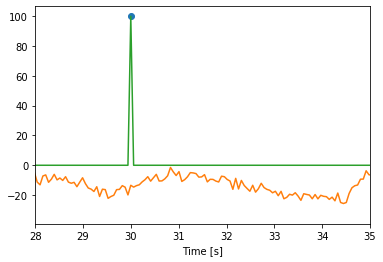

In [18]:
stim_trace = np.load(stim_path + '/stim_trace.npy')
stims_start = np.load(stim_path + '/stims_start.npy')
try:
    time_trace = np.load(stim_path + '/time_trace.npy')
except FileNotFoundError:
    time_trace = time_indices
    
logging.info('\n Loading existing stim trace and stim start from path \n{}'.format(output_path + fishlabel + '/stim_trace.npy'))

cell = 0

plt.plot(time_indices[stims_start], [100]*len(stims_start),'o')
plt.plot(time_indices, F[cell]-300)
try:
    plt.plot(time_indices, stim_trace*100)
except ValueError:
    plt.plot(time_trace, stim_trace*100)
plt.xlabel('Time [s]')
plt.xlim(28,35)

## Transform fluorescence signal

#### correct fluorescence based on neuropile signal, and get cells

In [19]:
F_corrected, cells = correct_2p_outputs(F, Fneu, iscell)
logging.info('\nNumber of ROIs: {} \nNumber of frames: {}, \nNumber of cells: {}'.format(F.shape[0], F.shape[1], 
                                                                                     len(cells)))

Number of ROIs:  55
Number of frames:  2099
Number of cells:  19
Calculating F corrected and cells index


In [9]:
layout_F = (go.Layout(title=go.layout.Title(text='Fluorescence of ROIs over time', x=0),
                        yaxis=go.layout.YAxis(title='F', showgrid=False, zeroline=False),
                        xaxis=go.layout.XAxis(title='Time [s]', showgrid=False, zeroline=False)))

plot_fluo(F_corrected, cells, time_indices, layout_F, plane, output_path+'/fig/')

### exclude weird cells

In [ ]:
# if you want to exclude cells from the analysis, type cell number separated by ','
exclude_cells = str(input(('Cells to exclude ?'))).split(',')
list_cells = cells.tolist()
logging.info('Number of initial cells:'+str(len(cells)))
try:
    for cell in exclude_cells:
        list_cells.remove(int(cell))
    cells = np.array(list_cells)
    logging.info('Excluding cell {}'.format(str(cell)))
    logging.info('\nNumber of remaining cells after exclusion: {}'.format(str(len(cells))))
except ValueError: # if no cells were input into exclude cells
    logging.info('No cells were excluded')

### Calculate DF/F and noise

In [ ]:
%matplotlib qt

try:
    dff, baseline_lims = calc_dff(F_corrected, cells, frame_rate)
    noise = np.zeros(F.shape[0])
    for cell in cells:
        inf, sup = baseline_lims
        noise[cell] = np.std(dff[cell, inf:sup])
except IndexError:
    logging.info('Could not find proper baseline for all cells. Exiting calc_dff.')



### if cells are too much spontaneously active, choose a baseline for each cell

In [20]:
def calc_dff_single(F_corrected, cells, frame_rate):
    logging.info('Could not find a baseline common to all cells.\nCalculating baseline for individual cells.')
    baseline_lims = list(np.zeros(F.shape[0]))
    DFF = np.zeros(F_corrected.shape)
    noise = np.zeros(F.shape[0])
    for roi in cells:
        plt.figure('Corrected fluorescence', figsize=(15, 10))
        plt.plot(np.transpose(Fneu[roi]), label='Fneu')
        plt.plot(np.transpose(F_corrected[roi]), label='F corrected')
        plt.legend()
        # when choosing it, you can do 2 clicks (lim inf and lim sup) or one (lim inf)
        # if only one is given, it will take the superior limit 10 seconds after the first one.
        baseline = plt.ginput(n=2, show_clicks=True)
        plt.close()
        lim_inf, a = baseline[0]
        if len(baseline) == 1:
            lim_sup = lim_inf + 5*fps
        elif len(baseline) == 2:
            lim_sup, a = baseline[1]
        lim_inf = int(lim_inf)
        lim_sup = int(lim_sup)
        print('You chose lim inf:', lim_inf)
        print('lim sup:', lim_sup)
        
        baseline = np.mean(F_corrected[roi][int(lim_inf):int(lim_sup)])
        DFF[roi] = (F_corrected[roi] - baseline) / baseline
        noise[roi] = np.std(DFF[roi, lim_inf:lim_sup])
        baseline_lims[roi] = (lim_inf, lim_sup)
    return DFF*100, baseline_lims, noise

In [21]:
%matplotlib qt

dff, baseline_lims, noise = calc_dff_single(F_corrected, cells, frame_rate)

You chose lim inf: 1778
lim sup: 1847
You chose lim inf: 68
lim sup: 132
You chose lim inf: 1990
lim sup: 2089
You chose lim inf: 2056
lim sup: 2092
You chose lim inf: 1987
lim sup: 2081
You chose lim inf: 669
lim sup: 791
You chose lim inf: 1982
lim sup: 2095
You chose lim inf: 1976
lim sup: 2092
You chose lim inf: 1990
lim sup: 2089
You chose lim inf: 1963
lim sup: 2087
You chose lim inf: 1971
lim sup: 2089
You chose lim inf: 1932
lim sup: 2056
You chose lim inf: 347
lim sup: 446
You chose lim inf: 918
lim sup: 1000
You chose lim inf: 66
lim sup: 118
You chose lim inf: 771
lim sup: 832
You chose lim inf: 1963
lim sup: 2084
You chose lim inf: 1932
lim sup: 2084
You chose lim inf: 2034
lim sup: 2100


## Plot DF/F of each cell

In [22]:
layout_dff = (go.Layout(title=go.layout.Title(text='Delta fluo over time', x=0),
                        yaxis=go.layout.YAxis(title='DFF [%]', showgrid=False, zeroline=False),
                        xaxis=go.layout.XAxis(title='Time [s]', showgrid=False, zeroline=False)))

plot_dff(dff, time_indices, time_trace, cells, plane, layout_dff, output_path+'/fig/', stim_trace)

-----------------
## Filter DF/F

In [23]:
def run_avg_filter(DFF, noise, avg_window, cells, baseline_lims):
    filtered_dff = DFF.copy()
    filtered_noise = np.zeros(noise.shape)
    filtered_noise[:] = np.nan

    filtered_dff = pd.DataFrame(filtered_dff).rolling(window=avg_window, axis=1).mean()
    
    try:
        lim_inf, lim_sup = baseline_lims
        for ROI in cells:
            filtered_noise[ROI] = np.std(filtered_dff.iloc[ROI, lim_inf:lim_sup])
            
    except ValueError:
        for ROI in cells:
            lim_inf, lim_sup = baseline_lims[ROI]
            filtered_noise[ROI] = np.std(filtered_dff.iloc[ROI, lim_inf:lim_sup])
    return filtered_dff, filtered_noise


def filtering_analysis(DFF, noise, windows, cells_interest, baseline_lims, zoom1, zoom2):
    DFF_T = DFF.T
    for i, window in enumerate(windows):
        filtered_dff, filtered_noise = run_avg_filter(DFF, noise, window, cells, baseline_lims)

        fig, (ax1, ax2) = plt.subplots(1, 2, num='Raw vs run avg ' + str(window), sharex=True, sharey=True,
                                       figsize=(10, 5))
        ax1.plot(time_indices, DFF_T[:, cells])
        ax1.set_title('Raw DF/F')
        ax1.set_xlabel('Time [sec]')
        ax1.set_ylabel('Raw DF/F')
        ax2.plot(time_indices, np.transpose(filtered_dff.iloc[cells]))
        ax2.set_title('Run avg ' + str(window))
        ax2.set_ylabel('Filtered DF/F')


        fig3 = plt.figure('All windows per cells', figsize=(15,10))
        for j, cell in enumerate(list(cells_interest)):
            plt.subplot(2, 2, j + 1)
            if i == 0:
                plt.plot(time_indices[zoom1:zoom2], DFF[cell, zoom1:zoom2], color='orange', label='Raw')
            plt.plot(time_indices[zoom1:zoom2], filtered_dff.iloc[cell, zoom1:zoom2], label='window=' + str(window))
            plt.title('Cell ' + str(cell))
            plt.ylim(dff_min, dff_max)
        plt.subplots_adjust(hspace=0.35)
        plt.legend(bbox_to_anchor=(1.1, 1.05), ncol=1)

    plt.show()
    return cells_interest

/home/mathilde.lapoix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:38: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



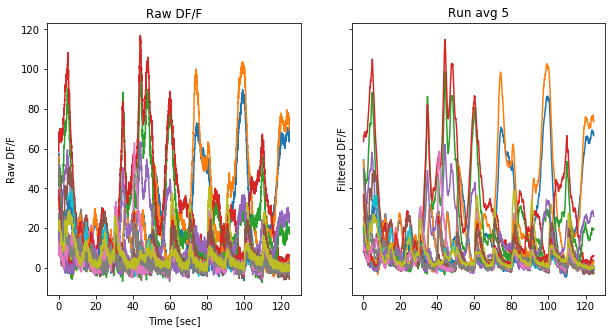

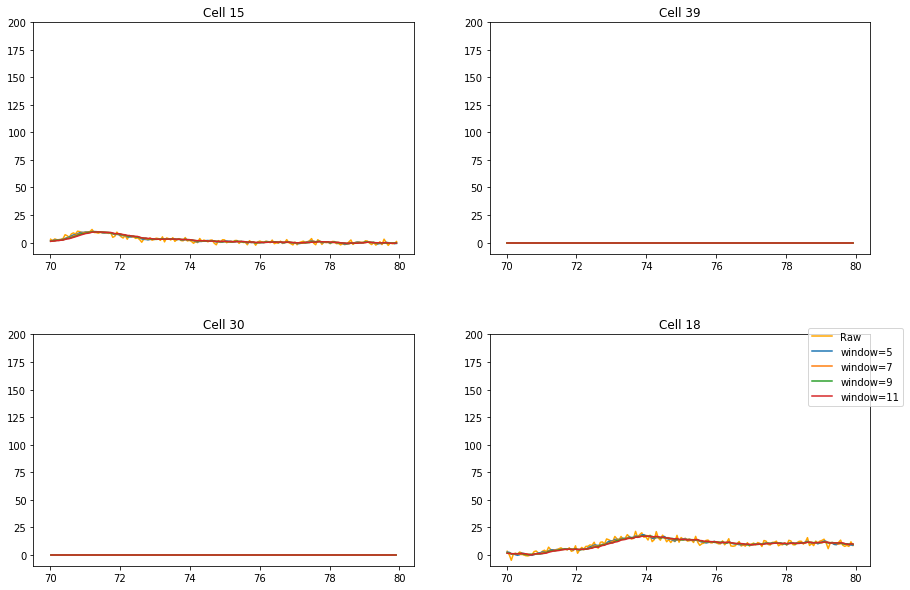

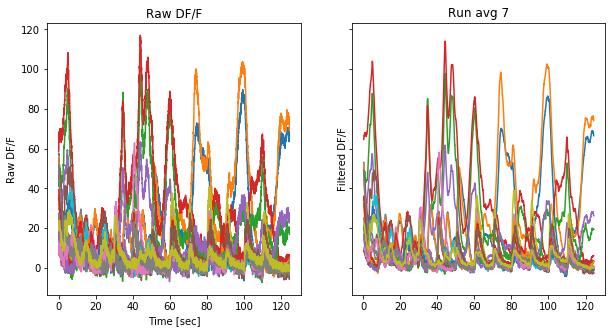

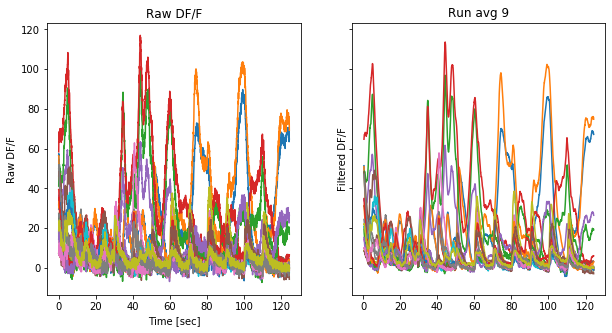

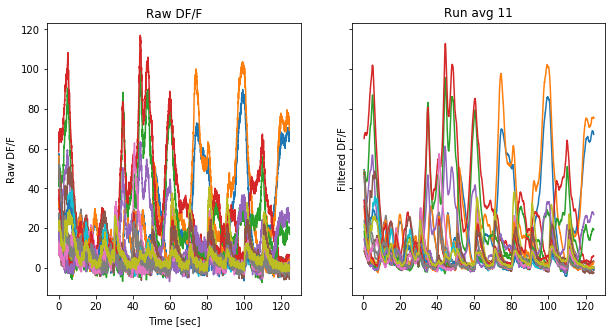

[15, 39, 30, 18]

In [24]:
%matplotlib inline
dff_min = -10
dff_max = 200
# filtering_analysis(dff, noise, [5,7,9,11], cells[10:14], baseline_lims, 650, 800)
filtering_analysis(dff, noise, [5,7,9,11], [15,39, 30, 18], baseline_lims, stims_start[4], stims_start[5])

In [25]:
# run on the chosen window
chosen_window = 5
filtered_dff, filtered_noise = run_avg_filter(dff, noise, chosen_window, cells, baseline_lims)

logging.info('Filtering DF/F using runnning average window, method=mean, window='+str(chosen_window))
dff_filtered = np.array(filtered_dff)
noise_filtered = np.array(filtered_noise)

### Replot the filtered DFF

In [26]:
def plot_dff_filtered(dff, time_indices, time_trace, cells, plane, layout, output_path):
    data = []
    for i in cells:
        if i == cells[0]:
            data = [data_single_cell_dff(i, dff, time_indices)]
        else:
            data.append(data_single_cell_dff(i, dff, time_indices))
    data.append(go.Scatter(name='stim trace', 
                           x=time_trace,
                           y=(stim_trace*100)-120))
    fig = go.Figure(data=data, layout=layout)
    plot(fig,
         filename=output_path + 'DFF_filtered_' + plane + '.html')
    return fig


layout_dff = (go.Layout(title=go.layout.Title(text='Filtered DF/F of all cells over time', x=0),
                        yaxis=go.layout.YAxis(title='DFF filtered', showgrid=False, zeroline=False),
                        xaxis=go.layout.XAxis(title='Time [s]', showgrid=False, zeroline=False)))

plot_dff_filtered(dff, time_indices, time_trace, cells, plane, layout_dff, output_path+'/fig/')

In [27]:
%matplotlib inline

--------------------------
## Group cells

Uses user input csv file with all the information needed to group the cells (midline, limits between each group, and the lateral_bulbar cells)

In [28]:
group_plane = df_summary.loc[fish_mask & plane_mask]

# build empty list to fill with cell info
cells_group = np.zeros(F.shape[0])
cells_group[:] = np.nan
cells_group = list(cells_group)
colors = cells_group.copy()
side = cells_group.copy()

# read in the csv files the cells that were input by user as lateral bulbar cells
try:
    bl_input = list(group_plane['lateral_bulbar'])[0].split(',')
    bulbar_lateral = list(map(int, bl_input))
except AttributeError:
    logging.info('No bulbar lateral cells found from user, or mistyped in the csv file.')
    bulbar_lateral = list() # bulbar lateral will be empty
    
bulbar_medial = []
spinal_cord = []
pontine = []

for cell in cells:
    # get cell group by user input
    # if cell in bulbar lateral
    if cell in bulbar_lateral:
        cells_group[cell] = 'bulbar_lateral'
        colors[cell] = 2
    # else, get cell gorup by x position vis à vis of x limits defined by user
    else:
        if get_pos_x(cell,stat) > int(group_plane['sc_bulbar']):
            spinal_cord.append(cell)
            cells_group[cell] = 'spinal_cord'
            colors[cell] = 1
        elif int(group_plane['bulbar_pontine']) < get_pos_x(cell,stat) <= int(group_plane['sc_bulbar']):
            bulbar_medial.append(cell)
            cells_group[cell] = 'bulbar_medial'
            colors[cell] = 3
        else:
            pontine.append(cell)
            cells_group[cell] = 'pontine'
            colors[cell] = 4
            
    # now define the side of the cell
    if get_pos_y(cell, stat) < int(group_plane['midline']):
        side[cell] = 'ipsi'
    else:
        side[cell] = 'contra'
        
logging.info('Spinal cord: {} cells.\nBulbar medial: {} cells.'.format(str(len(spinal_cord)), str(len(bulbar_medial))))
logging.info('Bulbar lateral: {} cells.\n Pontine: {} cells.'.format(str(len(bulbar_lateral)), str(len(pontine))))
cells_group = np.array(cells_group)
side = np.array(side)

x_positions = pd.Series(cells).apply(get_pos_x, args=(stat,))
y_positions = pd.Series(cells).apply(get_pos_y, args=(stat,))

### Plot cells group

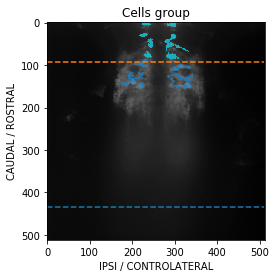

In [29]:
heatmap_group = np.zeros((ops['Ly'], ops['Lx']))
heatmap_group[:] = np.nan
for cell in cells:
    ypix = stat[cell]['ypix']
    xpix = stat[cell]['xpix']
    heatmap_group[ypix, xpix] = colors[cell]
plt.imshow(ops['meanImg'], cmap='Greys_r')
plt.imshow(heatmap_group, alpha=0.85, cmap='tab10', vmax=4)
plt.plot([0, ops['meanImg'].shape[0]-1], [int(group_plane['sc_bulbar']), int(group_plane['sc_bulbar'])], '--')
plt.plot([0, ops['meanImg'].shape[0]-1], [int(group_plane['bulbar_pontine']), int(group_plane['bulbar_pontine'])], '--')
plt.title('Cells group')
plt.xlabel('IPSI / CONTROLATERAL')
plt.ylabel('CAUDAL / ROSTRAL')
plt.savefig(output_path + '/fig/cell_group.png')

### Plot cells side

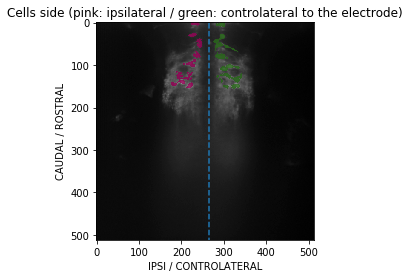

In [30]:
heatmap_side = np.zeros((ops['Ly'], ops['Lx']))
heatmap_side[:] = np.nan
for cell in cells:
    ypix = stat[cell]['ypix']
    xpix = stat[cell]['xpix']
    side_cell = side[cell]
    if side_cell == 'ipsi':
        heatmap_side[ypix, xpix] = 0
    elif side_cell == 'contra':
        heatmap_side[ypix, xpix] = 1
plt.imshow(ops['meanImg'], cmap='Greys_r')
plt.imshow(heatmap_side, alpha=0.85, cmap='PiYG') # in these parameters, the ipsi cells will be pink, the contra will be green
plt.plot([int(group_plane['midline'])]*2, [0, ops['meanImg'].shape[0]-1], '--')
plt.title('Cells side (pink: ipsilateral / green: controlateral to the electrode)')
plt.xlabel('IPSI / CONTROLATERAL')
plt.ylabel('CAUDAL / ROSTRAL')
plt.savefig(output_path + '/fig/cell_side.png')

## Build pandas DataFrame for simple plotting

In [31]:
def calc_cell_max_all_stim(roi, stims_start, dff, frame_rate, windows):
    """Calculate, for one cell, the max dff reached by this cell around each stimulation. 
    The signal in which the max dff will be looked for is defined by windows."""
        
    return pd.Series(range(nStim)).apply(calc_max_dff, args=(roi, stims_start, dff, frame_rate, windows))


def calc_cell_max_frame_all_stim(roi, stims_start, dff, frame_rate, windows):
    """Calculate, for one cell, the index at which the max dff was reached around each stimulation. 
    The signal in which the max dff will be looked for is defined by windows.
    See doc of find_max_index for more information."""
    
    return pd.Series(range(nStim)).apply(find_max_index, args=(roi, stims_start, dff, frame_rate, windows))


def calc_cell_recruitment_all_stim(roi, stims_start, dff, frame_rate, windows, noise, threshold, baseline_windows):
    """Calculate if a cell was recruited during each stimulation. 
    The signal in which the max dff will be looked for is defined by windows.
    
    Return pandas Series with 0 or 1 as recruitment for each stimulation."""
    
    return pd.Series(range(nStim)).apply(calc_recruitment, 
                                        args=(roi, stims_start, dff, frame_rate, windows, noise, 
                                              threshold, baseline_windows))

In [32]:
df_lf = pd.DataFrame({'cell': np.repeat(cells, nStim),
                      'stim': np.tile(list(range(nStim)), len(cells)),
                      'stim_intensity': np.tile(stim_intensities, len(cells))
                      'x_pos': np.repeat(x_positions, nStim),
                      'y_pos': np.repeat(y_positions, nStim),
                      'side': np.repeat(side[cells], nStim),
                      'group': np.repeat(cells_group[cells], nStim),
                      'dv_group': [dv_group]*len(np.repeat(cells, nStim)),
                      'fishlabel': [fishlabel]*len(np.repeat(cells, nStim)),
                      'plane': [plane]*len(np.repeat(cells, nStim)),
                      'real_plane': [real_plane]*len(np.repeat(cells, nStim)),
                      'cluster': [np.nan]*len(np.repeat(cells, nStim)),
                      'noise': np.repeat(noise[cells], nStim),
                      'noise_f': np.repeat(noise_filtered[cells], nStim),
                      'picked': [0]*len(np.repeat(cells, nStim)),
                      'max_dff': [0]*len(np.repeat(cells, nStim)),
                      'max_dff_f': [0]*len(np.repeat(cells, nStim)),
                      'index_max_dff': [0]*len(np.repeat(cells, nStim)),
                      'index_max_dff_f': [0]*len(np.repeat(cells, nStim)),
                      'recruitment': [0]*len(np.repeat(cells, nStim)),
                      'recruitment_f': [0]*len(np.repeat(cells, nStim))
                    
                     })



In [33]:
df_lf.head()

,cell,stim,x_pos,y_pos,side,group,dv_group,fishlabel,plane,real_plane,cluster,noise,noise_f,picked,max_dff,max_dff_f,index_max_dff,index_max_dff_f,recruitment,recruitment_f
0,0,0,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,0,0,0,0,0,0
0,0,1,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,0,0,0,0,0,0
0,0,2,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,0,0,0,0,0,0
0,0,3,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,0,0,0,0,0,0
0,0,4,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,0,0,0,0,0,0


In [34]:
# fill the max DF/F column
maxs = pd.Series(cells).apply(calc_cell_max_all_stim, 
                                          args=(stims_start, dff, frame_rate, windows))
df_lf.at[:,'max_dff'] = np.array(maxs).flatten()

# fill max DF/F filtered column
maxs_filtered = pd.Series(cells).apply(calc_cell_max_all_stim, 
                                          args=(stims_start, dff_filtered, frame_rate, windows))
df_lf.at[:, 'max_dff_f'] = np.array(maxs_filtered).flatten()


# fill the index_max_dff and index_max_dff_f columns
max_indices = pd.Series(cells).apply(calc_cell_max_frame_all_stim, 
                                          args=(stims_start, dff, frame_rate, windows))
df_lf.at[:,'index_max_dff'] = np.array(max_indices).flatten()

max_indices_f = pd.Series(cells).apply(calc_cell_max_frame_all_stim, 
                                          args=(stims_start, dff_filtered, frame_rate, windows))
df_lf.at[:,'index_max_dff_f'] = np.array(max_indices_f).flatten()


# fill the recruitment column
threshold_r = 3
recruits = pd.Series(cells).apply(calc_cell_recruitment_all_stim, 
                                          args=(stims_start, dff, frame_rate, windows, noise, 
                                                threshold_r, (1.5,0.3)))

df_lf.at[:, 'recruitment'] = np.array(recruits).flatten()

# fill the recruitment filtered column
recruits_filtered = pd.Series(cells).apply(calc_cell_recruitment_all_stim, 
                                          args=(stims_start, dff_filtered, frame_rate, windows, noise_filtered, 
                                                threshold_r, (1.5,0.3)))

df_lf.at[:, 'recruitment_f'] = np.array(recruits_filtered).flatten()

logging.info('Succesfully created DataFrame long format.')

In [35]:
df_lf.head()

,cell,stim,x_pos,y_pos,side,group,dv_group,fishlabel,plane,real_plane,cluster,noise,noise_f,picked,max_dff,max_dff_f,index_max_dff,index_max_dff_f,recruitment,recruitment_f
0,0,0,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,16.038174,14.747847,528,531,1,0
0,0,1,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,25.995223,24.482475,696,698,1,1
0,0,2,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,50.700509,47.655911,879,881,1,1
0,0,3,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,18.842369,17.294032,1031,1031,1,1
0,0,4,106.0,313.0,contra,bulbar_medial,ventral,201007_F02_chx10,160um,189,NaN,0.039503,3.781729,0,50.510411,46.751078,1230,1230,1,1


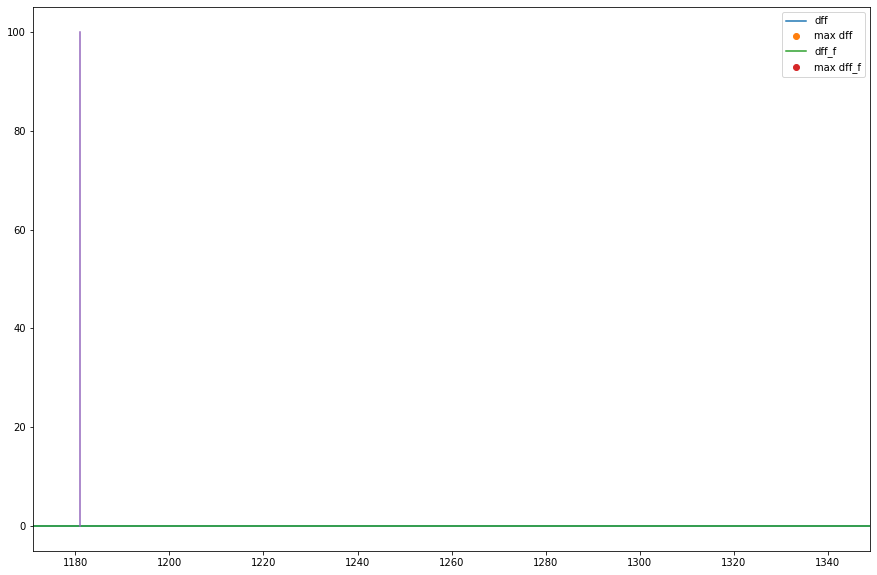

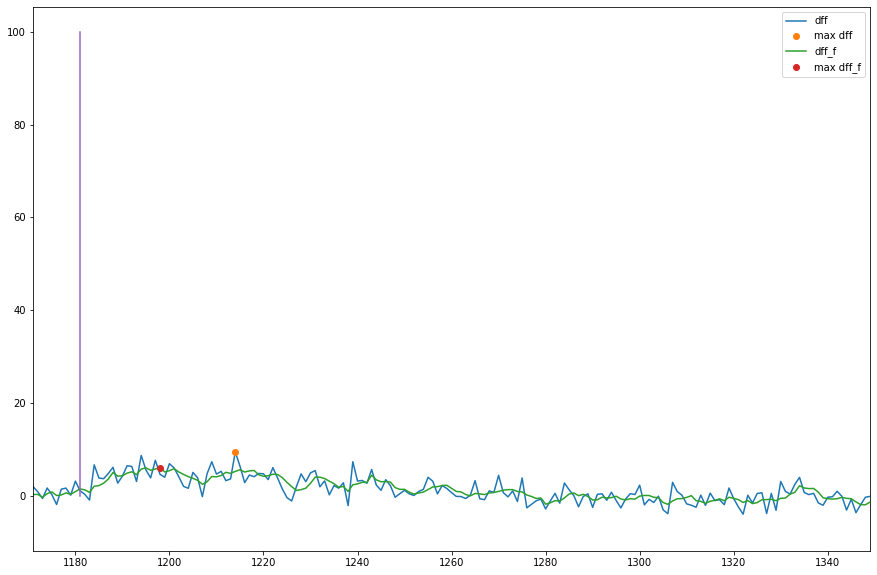

In [36]:
cell = 30
stim = 4

plt.figure(figsize=(15,10))
max_dff = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'max_dff']
index_max_dff = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'index_max_dff']
plt.plot(dff[cell], label='dff')
plt.plot(index_max_dff, max_dff, 'o', label='max dff')
max_dff_f = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'max_dff_f']
index_max_dff_f = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'index_max_dff_f']
plt.plot(dff_filtered[cell], label='dff_f')
plt.plot(index_max_dff_f, max_dff_f, 'o', label='max dff_f')
plt.plot([stims_start[stim]]*2, [0,100])
plt.xlim(stims_start[stim]-10,stims_start[stim+1])
plt.legend()

cell = cells[10]
stim = 4

plt.figure(figsize=(15,10))
max_dff = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'max_dff']
index_max_dff = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'index_max_dff']
plt.plot(dff[cell], label='dff')
plt.plot(index_max_dff, max_dff, 'o', label='max dff')
max_dff_f = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'max_dff_f']
index_max_dff_f = df_lf.loc[(df_lf.stim == stim) & (df_lf.cell == cell), 'index_max_dff_f']
plt.plot(dff_filtered[cell], label='dff_f')
plt.plot(index_max_dff_f, max_dff_f, 'o', label='max dff_f')
plt.plot([stims_start[stim]]*2, [0,100])
plt.xlim(stims_start[stim]-10,stims_start[stim+1])
plt.legend()

#### Check recruitment

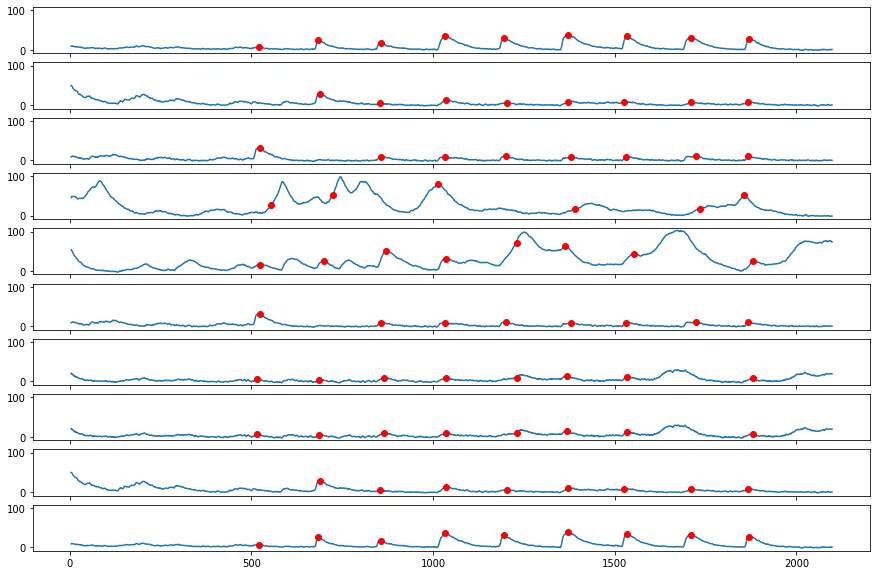

In [37]:
from check_recruitment import check_recruitment

check_recruitment(df_lf, dff_filtered, 10)

## Calculate reference x and y position

Manual referencing using one fish x and y as a reference fish.

In [38]:
x_ref, y_ref = (435, 265) # arbitary reference point chosen in one fish

df_lf = addRefPos(fishlabel, df_summary, x_ref, y_ref, df_lf)

### Build DataFrame with signal

In [39]:
def build_df_signal(roi, dff, dff_filtered, cells_group, cells, stims_start, windows):
    df = pd.DataFrame(columns=['cell', 'fishlabel', 'plane', 'real_plane', 'time_point', 'dff', 'dff_f', 'cluster', 'group', 'side', 'stim'],
                     index=np.arange(nFrames))
    df['cell'] = [roi]*nFrames
    df['fishlabel'] = [fishlabel]*nFrames
    df['plane'] = [plane]*nFrames
    df['real_plane'] = [real_plane]*nFrames
    df['time_point'] = time_indices
    df['dff'] = dff[roi]
    df['dff_f'] = dff_filtered[roi]
    df['cluster'] = [np.nan]*nFrames
    df['group'] = [cells_group[roi]]*nFrames
    df['side'] = [side[roi]]*nFrames
    stim_signal = [np.nan]*nFrames
    inf, sup = windows
    for stim in np.arange(nStim):
        start, end = stims_start[stim]-int(inf*frame_rate), stims_start[stim]+int(sup*frame_rate)
        df['stim'][start:end] = 'stim'+str(stim)
    return df

In [40]:
for i, cell in enumerate(cells):
    if i == 0:
        df_signal = build_df_signal(cell, dff, dff_filtered, cells_group, cells, stims_start, windows)
    else:
        df_signal = df_signal.append(build_df_signal(cell, dff, dff_filtered, cells_group, cells, stims_start, windows), 
                                     ignore_index=True)
        
logging.info('Successfully build DataFrame signal.')

/home/mathilde.lapoix/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [41]:

print('\ndf_signal is a data frame storing the dff of each cell with info on cell group and if time point was a stim.\n')
print('length:', len(df_signal))
df_signal.head()


df_signal is a data frame storing the dff of each cell with info on cell group and if time point was a stim.

length: 39881


,cell,fishlabel,plane,real_plane,time_point,dff,dff_f,cluster,group,side,stim
0,0,201007_F02_chx10,160um,189,0.000000,56.736553,NaN,NaN,bulbar_medial,contra,NaN
1,0,201007_F02_chx10,160um,189,0.059286,57.427817,NaN,NaN,bulbar_medial,contra,NaN
2,0,201007_F02_chx10,160um,189,0.118571,53.148106,NaN,NaN,bulbar_medial,contra,NaN
3,0,201007_F02_chx10,160um,189,0.177857,54.528557,NaN,NaN,bulbar_medial,contra,NaN
4,0,201007_F02_chx10,160um,189,0.237142,49.722138,54.312634,NaN,bulbar_medial,contra,NaN


### Rasterplot of DF/F traces

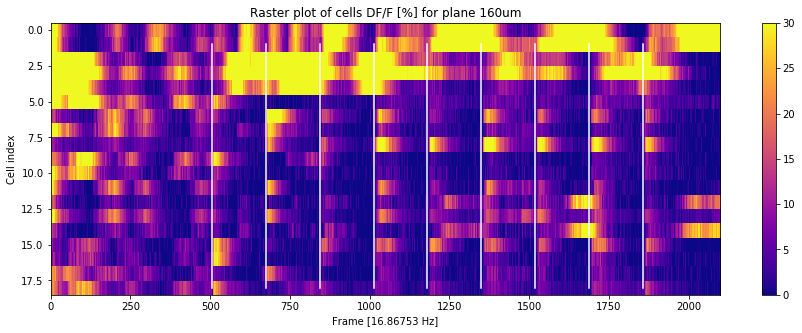

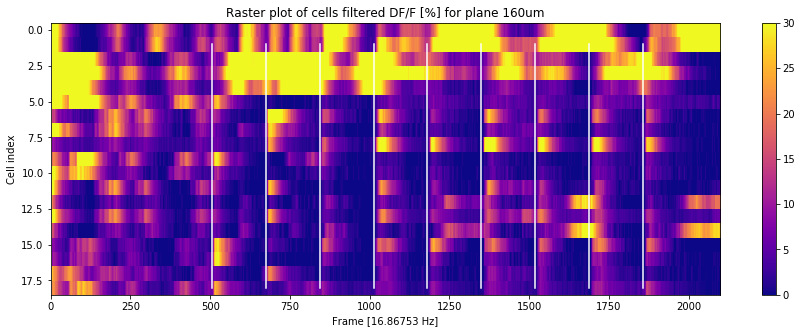

In [42]:
try:
    os.mkdir(output_path + '/fig/traces/')
except FileExistsError:
    pass

#TODO: change the fig size of these plots so that it's a function of how much cells you have 
# (so the pixel line is constant)

vmax= 30

plt.figure(figsize=(15,5))
plt.title('Raster plot of cells DF/F [%] for plane '+plane)

plt.imshow(dff[cells], aspect="auto", vmin=0, vmax=vmax, cmap='plasma')
plt.colorbar()

for stim in range(nStim):
    plt.plot([stims_start[stim]]*2, [1, len(cells)-1], color='white')

plt.ylabel('Cell index')
plt.xlabel('Frame [' + str(frame_rate) + ' Hz]')

plt.savefig(output_path +'/fig/traces/dff_rasterplot.png')


vmax= 30

plt.figure(figsize=(15,5))
plt.title('Raster plot of cells filtered DF/F [%] for plane '+plane)

plt.imshow(dff_filtered[cells], aspect="auto", vmin=0, vmax=vmax, cmap='plasma')
plt.colorbar()

for stim in range(nStim):
    plt.plot([stims_start[stim]]*2, [1, len(cells)-1], color='white')

plt.ylabel('Cell index')
plt.xlabel('Frame [' + str(frame_rate) + ' Hz]')

plt.savefig(output_path +'/fig/traces/filtered_dff_rasterplot.png')

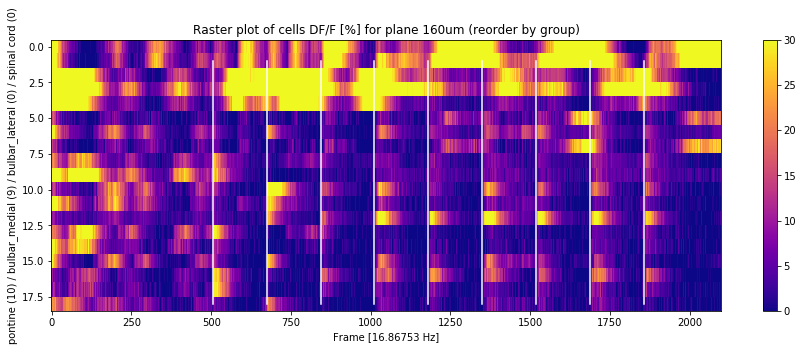

In [43]:
# reorder the dff to cluster cells by location

dff_reorder = dff[spinal_cord+bulbar_lateral+bulbar_medial+pontine]

# you can change vmax to have a different representation. It is purely arbitrary here.

vmax = 30

plt.figure(figsize=(15,5))
plt.title('Raster plot of cells DF/F [%] for plane '+plane + ' (reorder by group)')

plt.imshow(dff_reorder, aspect="auto", vmin=0, vmax=vmax, cmap='plasma')
plt.colorbar()

for stim in range(nStim):
    plt.plot([stims_start[stim]]*2, [1, len(cells)-1], color='white')

plt.ylabel('pontine (' + str(len(pontine)) + ') / bulbar_medial (' + 
           str(len(bulbar_medial)) + ') / bulbar_lateral (' + str(len(bulbar_lateral)) + 
           ') / spinal cord (' + str(len(spinal_cord)) + ')')
plt.xlabel('Frame [' + str(frame_rate) + ' Hz]')

plt.savefig(output_path +'/fig/traces/dff_rasterplot_reorder.png')

------------------------------------------  
  
## Save output struct

In [45]:
save_input = str(input('Save ? y/(n)'))

if save_input == 'y':

    struct['time_indices'] = time_indices

    struct['F_corrected'] = F_corrected
    struct['cells'] = cells # list of ROIs indices identified as cells
    
    try:
        struct['excluded_cells'] = exclude_cells
    except NameError:
        pass
    
    struct['baseline_lims'] = baseline_lims # which frames where taken as F baseline
    struct['dff'] = dff
    struct['noise'] = noise

    struct['stims_start'] = stims_start # list of frame at which stim was started
    struct['stim_trace'] = stim_trace

    struct['cells_group'] = cells_group # array of which groups a cell belongs to. NaN if not a cell.
    struct['dff_reorder'] = dff_reorder

    struct['df_lf'] = df_lf
    struct['df_signal'] = df_signal

    struct['dff_filtered'] = dff_filtered
    struct['noise_filtered'] = noise_filtered

    struct_path = output_path + '/dataset/struct'
    with open(struct_path, 'wb') as handle:
            pickle.dump(struct, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
    logging.info('Succesfully saved struct as: ' + struct_path)


Save ? y/(n)y
